## Clustering con uso de librerias. Datos 1

Proyecto 4. Clustering

- Flores Tun, Jorge David;
- Sánchez Soberanis, Felipe

## Enlace de video



[Video_proyecto_4_Flores_Sanchez](https://alumnosuady-my.sharepoint.com/:v:/g/personal/a18214854_alumnos_uady_mx/EQoukkgUyExKtYTEHzC4FDABkVxbr86rRAuB5_lBaB4BJw?e=UfkLkL)

Para esta base de datos, el cual contiene información de domicilios particulares e información relevante, se recuperarán los datos de su ubicación geográfica para agruparlos geográficamente sin nungún criterio particular, y simplemente aplicando los métodos del codo y silueta para los modelos de agrupamiento.

A continuación se presentan los métodos y el procesamiento de datos finales.

## Librerías

In [1]:

#---------------Herramientas matemáticas importantes-------------------------
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#-------Herramientas de SKLearn: agrupamiento kmeans y puntaje de silueta----
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

#---------Preprocesamiento de datos usando el escalamiento estándar----------
from sklearn.preprocessing import StandardScaler

#P------------------------resentación de mapas-------------------------------
import folium

## Funciones y métodos

### Función de optimización de agrupamiento usando los métodos del codo y silueta en paralelo

In [2]:
def optimalClusters(
        data,
        max_Clusters: int,
        init_mode   = 'k-means++',
        nInit       = 'auto',
        randomState = 45,
        max_iter    = 50,):
    
    distortion_elbow, distortion_silhouette = [], []
    
    for i in range(2, max_Clusters + 1):
        test_model = KMeans(
            n_clusters          = i,
            init                = init_mode,
            n_init              = nInit,
            random_state        = randomState,
            max_iter            = max_iter,
        )
        test_model.fit(data)
    
        #Elbow method
        distortion_elbow.append(test_model.inertia_)
    
        #Silhouette method
        labels1 = test_model.fit_predict(data)
        sil_avg = silhouette_score(data, labels1)
        distortion_silhouette.append(sil_avg)
    
    return distortion_elbow, distortion_silhouette

### Función de comparación visual de los métodos del codo y silueta usando matplotlib

In [3]:
def elbow_and_silhouette_visual_comparison(
        distortion_elbow_list           : list[float], 
        distortion_silhouette_list      : list[float],
        elbow_Color                     = '#385187',
        silhouette_Color                = '#027A7B',
        fig_size                        = (11, 6),):
    
    #--------------- Some variables -------------------
    iterations = np.array(distortion_elbow_list).shape[0] + 2
    
        
    fig, ax1 = plt.subplots(figsize = fig_size)
    ax1.set_title('Elbow Method and Silhouette Method Comparison', size = 20, pad = 10)

    #--------------- WCSS / Distorsion -----------------
    ax1.plot(
        range(2, iterations), 
        distortion_elbow_list, 
        linestyle = '--', 
        linewidth = 1.5, 
        marker = 'P', 
        markersize = 10, 
        color = elbow_Color, 
        label = 'The Elbow Method',)
    
    #----------- optimal number of clusters -----------------
    ax1.set_xlabel( 'Number of clusters', size = 15 )
    ax1.set_ylabel('WCSS', size = 15 )
    ax1.tick_params( axis = 'x', labelsize = 12 )
    ax1.tick_params( axis = 'y', labelsize = 12 )

    plt.legend(loc='upper center', prop = {'size':12})
    
    # ------------- silhoutte coeff -------------
    ax2 = ax1.twinx()
    ax2.plot(
        range(2, iterations), 
        distortion_silhouette_list,
        linestyle = ':', linewidth = 1.5,
        marker = 'o', markersize = 10,
        color = silhouette_Color ,
        label = 'The Silhouette Method',)

    ax2.set_ylabel('\nSilhoutte Coefficent', size = 15)
    ax2.tick_params(axis = 'y', labelsize = 12)
    plt.legend(loc=0, prop = {'size':12})

    ax1.grid(linestyle = 'dashed', alpha = 0.5)
    
    plt.show()

### Modelo final de agrupamiento / clustering

In [4]:
def labels_KMeans(
    data, 
    n_cluster   : int, 
    init_mode   = 'k-means++', 
    n_init      = 'auto', 
    randomState = 45, 
    max_iter    = 50,):
    
    kmeans_model_Final = KMeans(
            n_clusters          = n_cluster,
            init                = init_mode,
            n_init              = n_init,
            random_state        = randomState,
            max_iter            = max_iter,
        )
    kmeans_model_Final.fit(data)
    labels = kmeans_model_Final.predict(data)
    centroid = kmeans_model_Final.cluster_centers_
    
    
    return labels, centroid

## Datos 1: Mapas de domicilios en el Estado de California, EEUU.

In [5]:
housingDF = pd.read_csv('data/info_Casas_SF.csv')
housingDF.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


Para esta primera parte, y para la unicación geográfica de los resultados, se extraen los datos de las coordenadas geográficas en latitud y altitud

In [6]:
df_map = housingDF[['longitude', 'latitude']]
df_map.head()

,longitude,latitude
0,-122.23,37.88
1,-122.22,37.86
2,-122.24,37.85
3,-122.25,37.85
4,-122.25,37.85


Para este primer análisis, se agruparán de forma geográfica.

Se procede a preprocesar los datos escalando y normalizando los valores mediante `StandardScaler()`

Este modelo servirá para revertir los valores de centroides que se encontrarán para ubicarlos geogáficamente.

In [7]:
map_scaler = StandardScaler()
map_scaler.fit(df_map)

df_map_standardized = map_scaler.transform(df_map)

### Prepocesamiento y optimización de agrupamientos

In [8]:
elbow_List, silhouette_List = optimalClusters(df_map_standardized, max_Clusters=14)

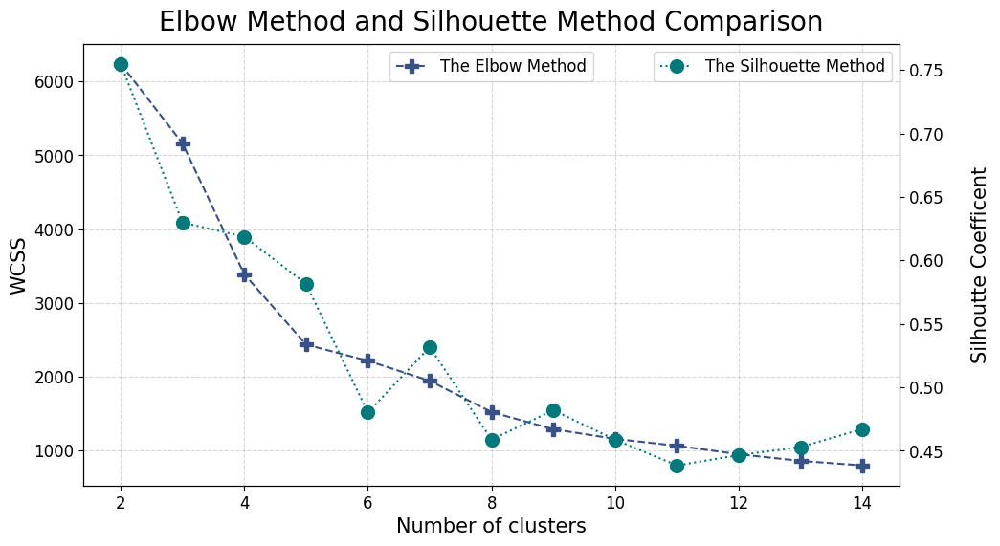

In [9]:
elbow_and_silhouette_visual_comparison(elbow_List, silhouette_List)

Desde la perspectiva del método del codo, se puede elegir entre 5 y 6 agrupamiento para el modelo final, y contemplando el coeficiente de silueta como 7, también se puede optar por ese valor.

Como, al final, los valores más optimos de la reducción de error se cotempla en los 6 agrupamientos, se toma `clusters = 6`

In [10]:
clusters = 6
map_lablels, centers = labels_KMeans(df_map_standardized, n_cluster = clusters)

Se representan los resultados en un mapa de puntos tipo scatter en `matplotlib`

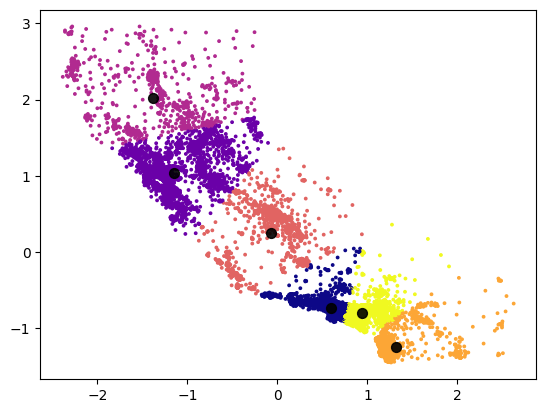

In [11]:
plt.scatter(df_map_standardized[:, 0], df_map_standardized[:, 1], c = map_lablels, s = 3, cmap = 'plasma')
plt.scatter(centers[:, 0], centers[:, 1], c = 'black', s = 50, alpha = 0.9)

Si los resultados de este algoritmo necesitan ser representados en un mapa geográfico, es necesario escalar de forma inversa los valores de entrada y los centroides obtenidos.

Únicamente se realiza este proceso para los ccentroides usando `inverse_transform()` de la base de transformación numérica usada para la ubicación geográfica.

In [12]:
centersNew = map_scaler.inverse_transform(centers)

print(centers, '\n\n', centersNew)

[[ 0.59869487 -0.73132194]
 [-1.14890837  1.0372889 ]
 [-1.38176958  2.01505969]
 [-0.07051724  0.24884783]
 [ 1.32229606 -1.24303647]
 [ 0.93602159 -0.79810154]] 

 [[-118.37043227   34.07040674]
 [-121.87199352   37.8479225 ]
 [-122.33856269   39.93630989]
 [-119.71128993   36.16391802]
 [-116.92059868   32.97745307]
 [-117.69455222   33.92777447]]


## Visualización de mapas usando folium

Esta librería de python ofrece visualización geográfica con la misma calidad que ofrecen los servicios en línea populares.

Cuenta con herramientas de visualización, estilo de mapeo y marcado de puntos.

Se pueden incorporar scripts en html para mejorar la visualización de leyendas tipos pop-up, uso de diccionarios y archivos json para marcado de regiones, tales como estados, ciudades y delimitaciones de países.

Con esta librería se representará los resultados de la clasificación geográfica de la base de datos.

### Variables y archivos necesarios para visualización

In [13]:

#-------------Cluster/member's color--------------
colorsDic = {
    '0' : '#0295ca',
    '1' : '#75b9d4',
    '2' : '#38b1c2',
    '3' : '#017c6e',
    '4' : '#00a76a',
    '5' : '#52c7b8',
    '6' : '#519876',
}

#--------El mapa es un objeto tipo folium.map------
zoom = 6
map_SF = folium.Map(location=[37.50,-122.2], zoom_start=zoom, min_zoom=zoom, max_zoom=zoom)

### Visualización final de los puntos clasificados geográficamente

In [14]:
for i in range(len(df_map)):
    folium.Circle(
        radius      = 100,
        location    = [df_map['latitude'][i], df_map['longitude'][i]],
        color       = colorsDic[str(map_lablels[i])],
        fill=True,
    ).add_to(map_SF)
    
for j in range(centersNew.shape[0]):
    lat, lon = centersNew[j, 1], centersNew[j, 0] 
    folium.Marker(
        location=[lat, lon],
        icon=folium.Icon(color='black',prefix='glyphicon',icon='crosshairs'),
        popup='<h3 style="color:black;">Centroide: ' + str(round(lat, 3)) + ', ' + str(round(lon, 3)) + '</h3>',
    ).add_to(map_SF)
    
map_SF

## Conclusiones generales

Los centroides de la región sur del Estado de California aglomeran una gran cantidad de domicilios particulares, y es la razón por la que los clusters son pequeños. Se sabe que en la región sur tiene una de las zonas metropolitanas más grandes e importantes de Estados Unidos, comprendiendo de la zona costera y la delimitación con México.